In [8]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import random
import seaborn as sns

In [1]:
%cd D:\projects\Fruit_flask\Fruit_cata

D:\projects\Fruit_flask\Fruit_cata


## Fruits photos

In [36]:
def show_rand(x,dir_='apple'):
    if len(x)==30:
        f,ax=plt.subplots(6,5,figsize=(40,40))
        for i,file_name in enumerate(x):
            img=cv2.imread( os.path.join(dir_,file_name) )
            img=cv2.resize(img,(100,100))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            
            ax[i//5][i%5].imshow(img, aspect='auto')
            ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
        plt.show()

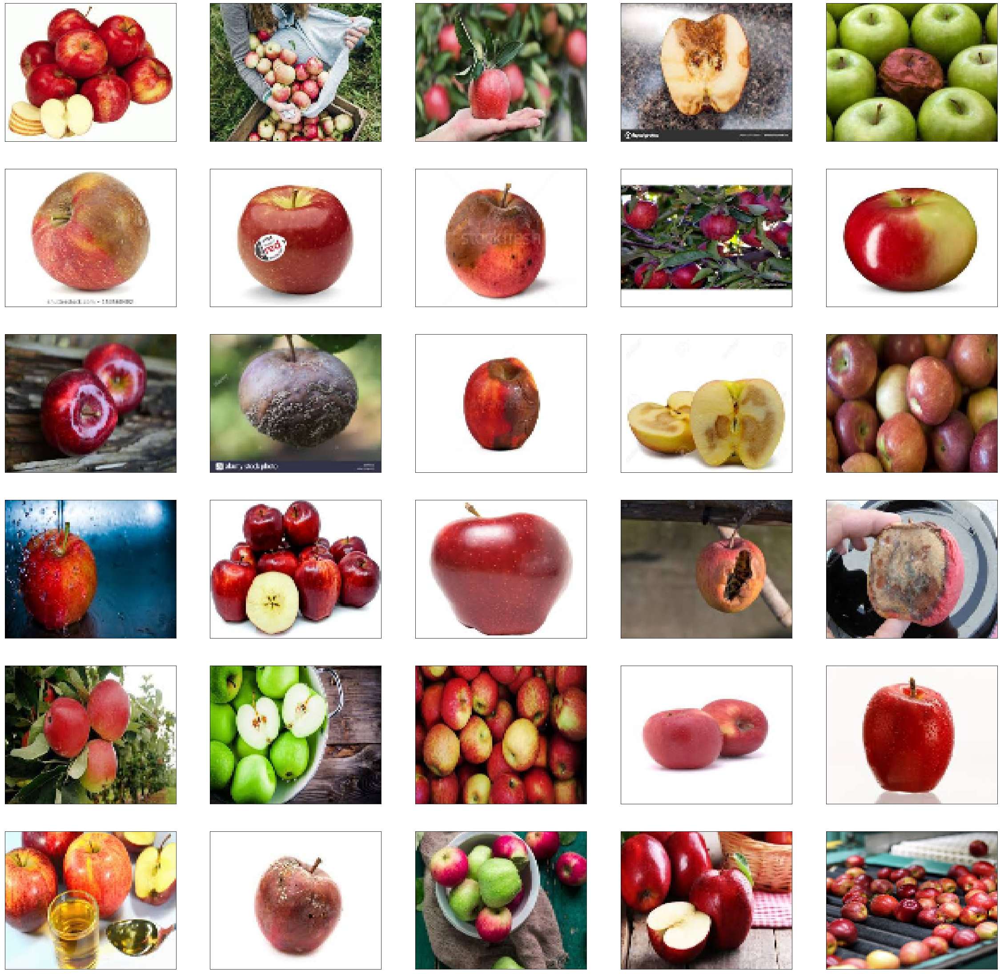

In [35]:
show_rand(random.sample(os.listdir('apple'), 30),dir_='apple')

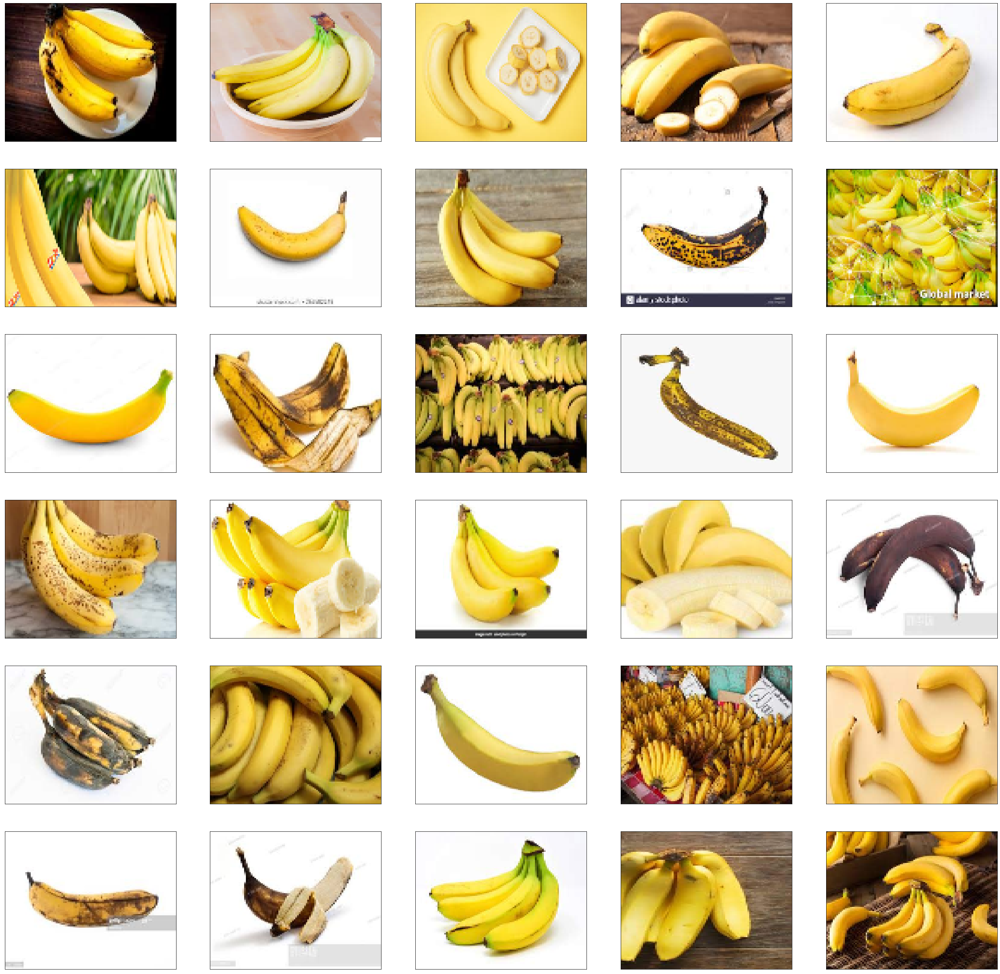

In [40]:
show_rand(random.sample(os.listdir('banana'), 30),dir_='banana')

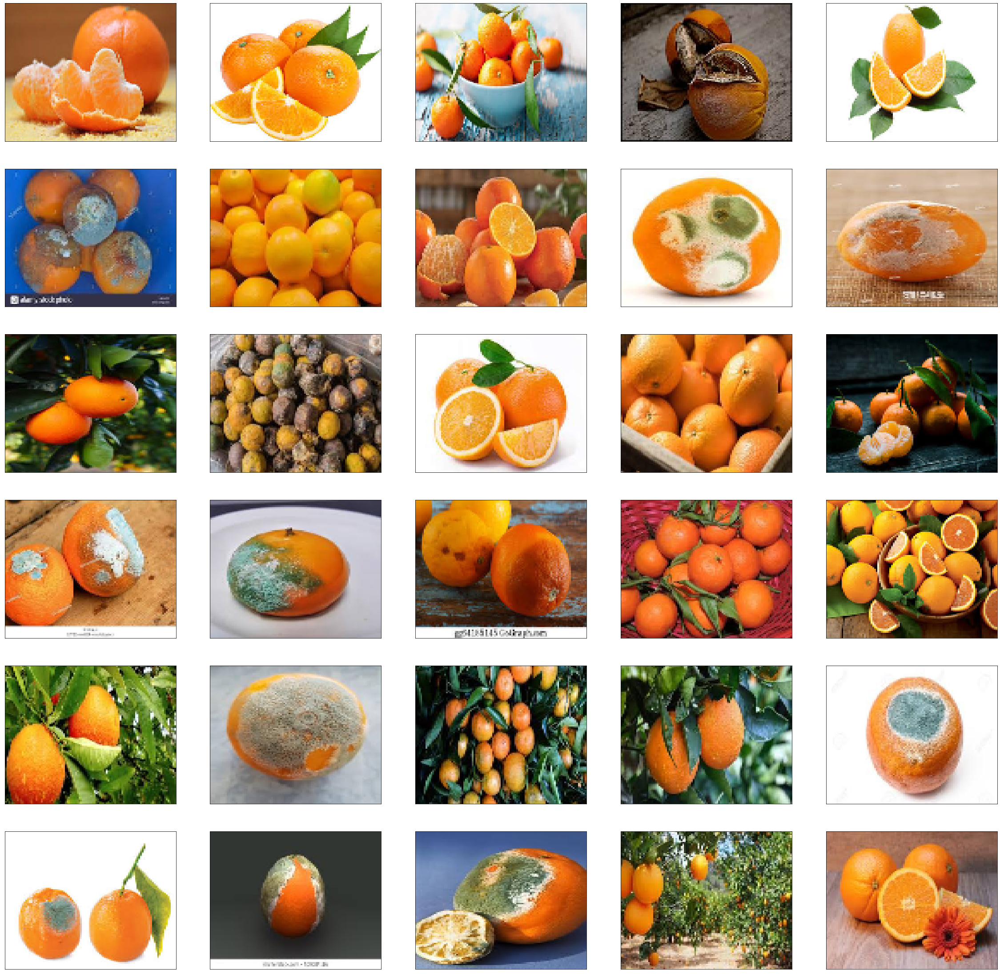

In [39]:
show_rand(random.sample(os.listdir('orange'), 30),dir_='orange')

### apple=0, banana=1, orange=2

### Rotten:1 fresh:0

>Keras has now added Train / validation split from a single directory using ImageDataGenerator:

In [1]:
import keras 
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Activation, Dropout

Using TensorFlow backend.


In [15]:
train_datagen = ImageDataGenerator(rescale=1.255,
    width_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.18)

In [80]:
train_generator = train_datagen.flow_from_directory(
    'D:\projects\Fruit_flask',
    target_size=(100,100),
    batch_size=20,
    class_mode='categorical',
    subset='training') # set as training data


validation_generator = train_datagen.flow_from_directory(
    'D:\projects\Fruit_flask', # same directory as training data
    target_size=(100,100),
    batch_size=20,
    class_mode='categorical',
    subset='validation')

Found 361 images belonging to 3 classes.
Found 77 images belonging to 3 classes.


In [81]:
train_generator.class_indices

{'apple': 0, 'banana': 1, 'orange': 2}

In [3]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from keras.applications import vgg16
from keras.callbacks import ModelCheckpoint


Using TensorFlow backend.


In [83]:
model=load_model('C:/Users/Akhilesh/Downloads/fruit_cata.h5')
# model=keras.applications.VGG16(
#     include_top=False,
#     weights="imagenet",
#     input_tensor=None,
#     input_shape=(100,100,3)
# )

In [84]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 100, 100, 32)      896       
_________________________________________________________________
batch_normalization_8 (Batch (None, 100, 100, 32)      128       
_________________________________________________________________
separable_conv2d_6 (Separabl (None, 100, 100, 32)      1344      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 50, 50, 32)        128       
_________________________________________________________________
dropout_8 (Dropout)          (None, 50, 50, 32)        0         
_________________________________________________________________
separable_conv2d_7 (Separabl (None, 50, 50, 64)       

In [85]:
# Freeze first 10 the layers
for layer in model.layers[:10]:
    layer.trainable = False

In [86]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.categorical_crossentropy,
               metrics=['accuracy'])

In [87]:
check_point=ModelCheckpoint(
    filepath='C:/Users/Akhilesh/Downloads/local_fruit.h5', monitor='val_loss', verbose=1, save_best_only=True,
    save_weights_only=False, mode='min')

In [88]:
history=model.fit_generator(
    train_generator,
    steps_per_epoch = train_generator.samples // 20,
    validation_data = validation_generator, 
    validation_steps = validation_generator.samples // 20,
    epochs = 100, callbacks=[check_point])

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 18 steps, validate for 3 steps
Epoch 1/100
17/18 [===========================>..] - ETA: 0s - loss: 4.9511 - accuracy: 0.7477
Epoch 00001: val_loss improved from inf to 2.23046, saving model to C:/Users/Akhilesh/Downloads/local_fruit.h5
18/18 [==============================] - 3s 173ms/step - loss: 4.9626 - accuracy: 0.7419 - val_loss: 2.2305 - val_accuracy: 0.8333
Epoch 2/100
17/18 [===========================>..] - ETA: 0s - loss: 1.4186 - accuracy: 0.7819
Epoch 00002: val_loss improved from 2.23046 to 1.58771, saving model to C:/Users/Akhilesh/Downloads/local_fruit.h5
18/18 [==============================] - 2s 108ms/step - loss: 1.4839 - accuracy: 0.7830 - val_loss: 1.5877 - val_accuracy: 0.7500
Epoch 3/100
17/18 [===========================>..] - ETA: 0s - loss: 0.9316 - accuracy: 0.7941
Epoch 00003: val_loss improved from 1.58771 to 1.31854, saving model to C:/Users/Akhilesh/Downloads/local_fruit.h5
18/18 [==============

Epoch 28/100
17/18 [===========================>..] - ETA: 0s - loss: 0.2845 - accuracy: 0.8660
Epoch 00028: val_loss improved from 0.21537 to 0.20306, saving model to C:/Users/Akhilesh/Downloads/local_fruit.h5
18/18 [==============================] - 2s 101ms/step - loss: 0.2753 - accuracy: 0.8739 - val_loss: 0.2031 - val_accuracy: 0.9167
Epoch 29/100
17/18 [===========================>..] - ETA: 0s - loss: 0.2894 - accuracy: 0.8598
Epoch 00029: val_loss did not improve from 0.20306
18/18 [==============================] - 2s 99ms/step - loss: 0.2865 - accuracy: 0.8680 - val_loss: 0.5999 - val_accuracy: 0.8667
Epoch 30/100
17/18 [===========================>..] - ETA: 0s - loss: 0.2483 - accuracy: 0.8972
Epoch 00030: val_loss did not improve from 0.20306
18/18 [==============================] - 2s 97ms/step - loss: 0.2462 - accuracy: 0.8974 - val_loss: 0.5824 - val_accuracy: 0.8833
Epoch 31/100
17/18 [===========================>..] - ETA: 0s - loss: 0.4852 - accuracy: 0.8598
Epoch 00

Epoch 57/100
17/18 [===========================>..] - ETA: 0s - loss: 0.2419 - accuracy: 0.9221
Epoch 00057: val_loss did not improve from 0.10910
18/18 [==============================] - 2s 96ms/step - loss: 0.2458 - accuracy: 0.9150 - val_loss: 0.4011 - val_accuracy: 0.9167
Epoch 58/100
17/18 [===========================>..] - ETA: 0s - loss: 0.2153 - accuracy: 0.9128
Epoch 00058: val_loss did not improve from 0.10910
18/18 [==============================] - 2s 100ms/step - loss: 0.2095 - accuracy: 0.9150 - val_loss: 0.1833 - val_accuracy: 0.9500
Epoch 59/100
17/18 [===========================>..] - ETA: 0s - loss: 0.1869 - accuracy: 0.9128
Epoch 00059: val_loss did not improve from 0.10910
18/18 [==============================] - 2s 110ms/step - loss: 0.1908 - accuracy: 0.9091 - val_loss: 0.6426 - val_accuracy: 0.9333
Epoch 60/100
17/18 [===========================>..] - ETA: 0s - loss: 0.2071 - accuracy: 0.9059
Epoch 00060: val_loss did not improve from 0.10910
18/18 [=============

In [4]:
#$main
new_model=load_model('C:/Users/Akhilesh/Downloads/local_fruit_final.h5')

In [10]:
rotten_model=load_model('C:/Users/Akhilesh/Downloads/rotten.h5')

In [ ]:
rotten_model.p

In [123]:
def show_rand_pred(x,dir_='apple', model=None, model_2=None):
    if len(x)==30:
        f,ax=plt.subplots(6,5,figsize=(40,40))
        for i,file_name in enumerate(x):
            img=cv2.imread( os.path.join(dir_,file_name) )
            img=cv2.resize(img,(100,100))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            ax[i//5][i%5].set_title('Fruit:{}, quality:{}'.format(model.predict_classes(np.expand_dims(img,axis=0)),model_2.predict_classes(np.expand_dims(img,axis=0))))
            ax[i//5][i%5].imshow(img, aspect='auto')
            ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
        plt.show()

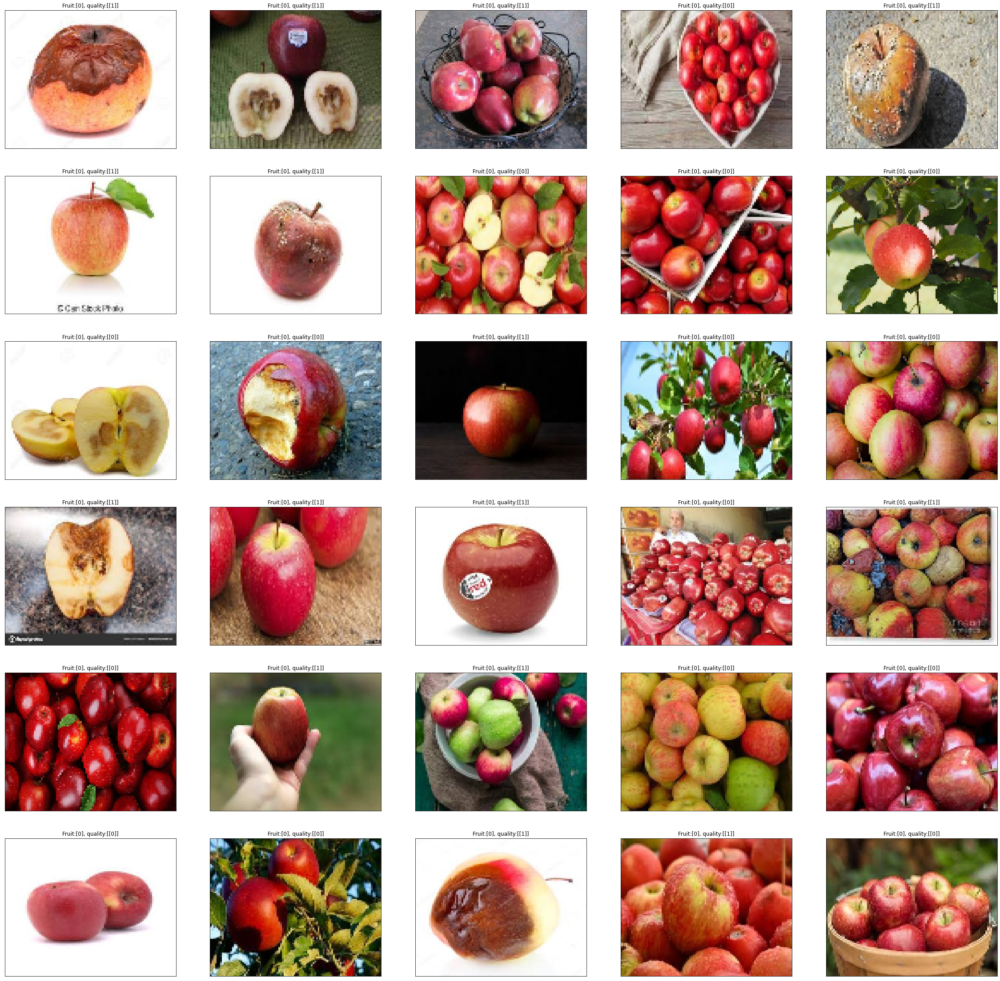

In [14]:
show_rand_pred(random.sample(os.listdir('apple'), 30), model=new_model, model_2=rotten_model)

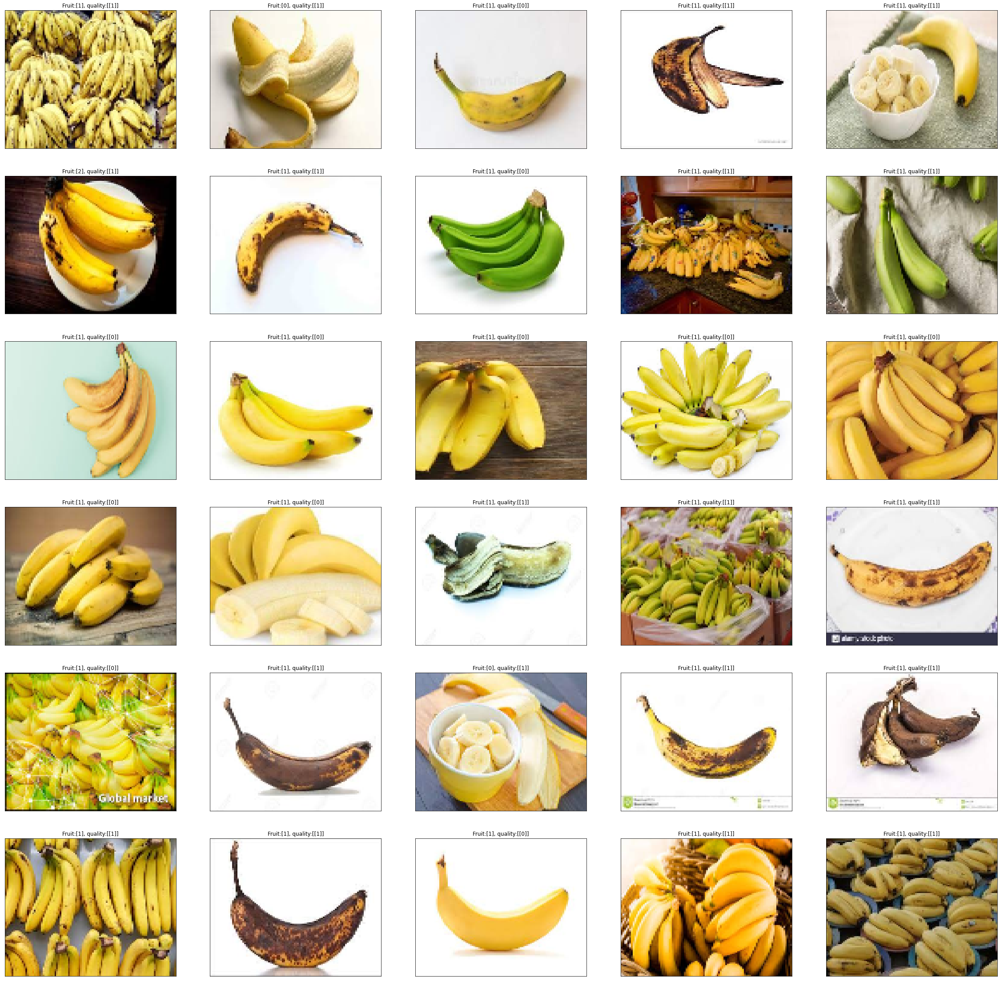

In [15]:
show_rand_pred(random.sample(os.listdir('banana'), 30) ,dir_='banana' ,model=new_model, model_2=rotten_model)

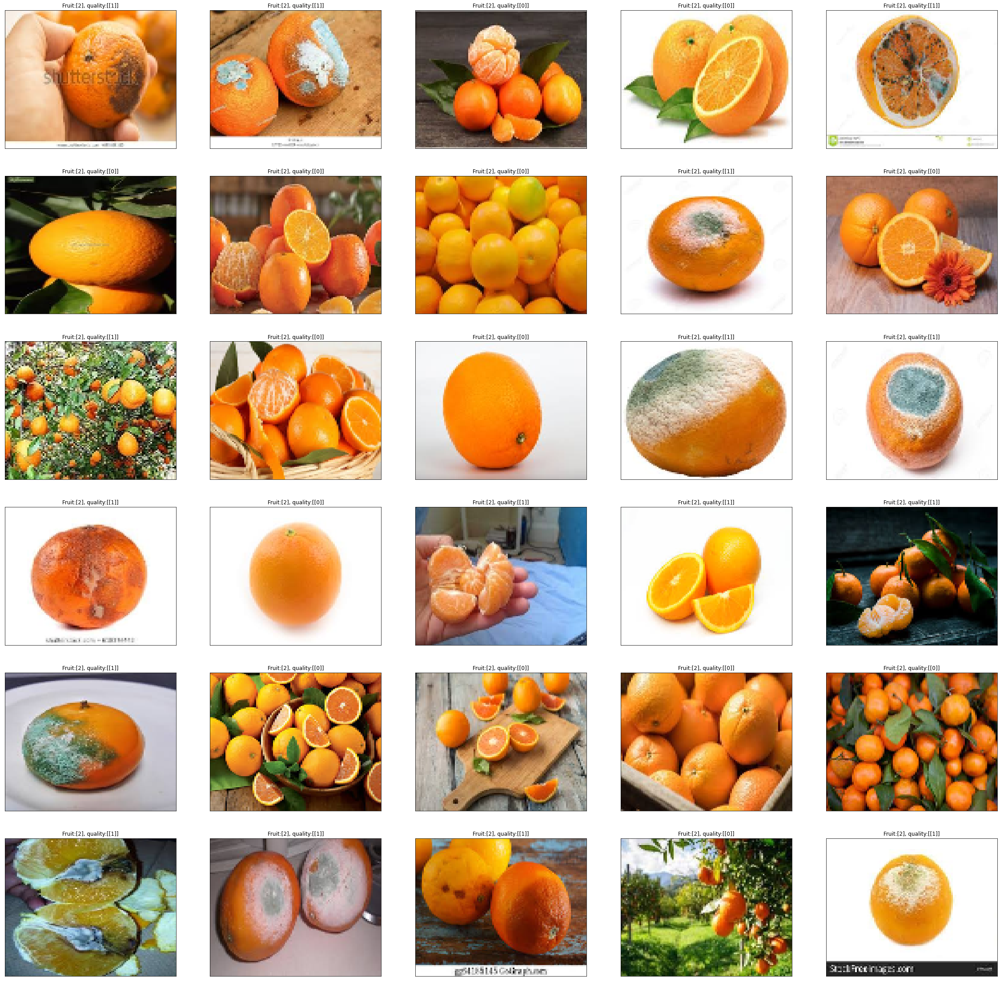

In [16]:
show_rand_pred(random.sample(os.listdir('orange'), 30) ,dir_='orange' ,model=new_model, model_2=rotten_model)

> We can se our rotten classifier model performs quite descent
# Rotten pics

In [124]:
%cd D:\projects\Fruit_flask\quality

D:\projects\Fruit_flask\quality


In [8]:
def show_rand(x,dir_='fresh'):
    if len(x)==30:
        f,ax=plt.subplots(6,5,figsize=(40,40))
        for i,file_name in enumerate(x):
            img=cv2.imread( os.path.join(dir_,file_name) )
            img=cv2.resize(img,(100,100))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            
            ax[i//5][i%5].imshow(img, aspect='auto')
            ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
        plt.show()

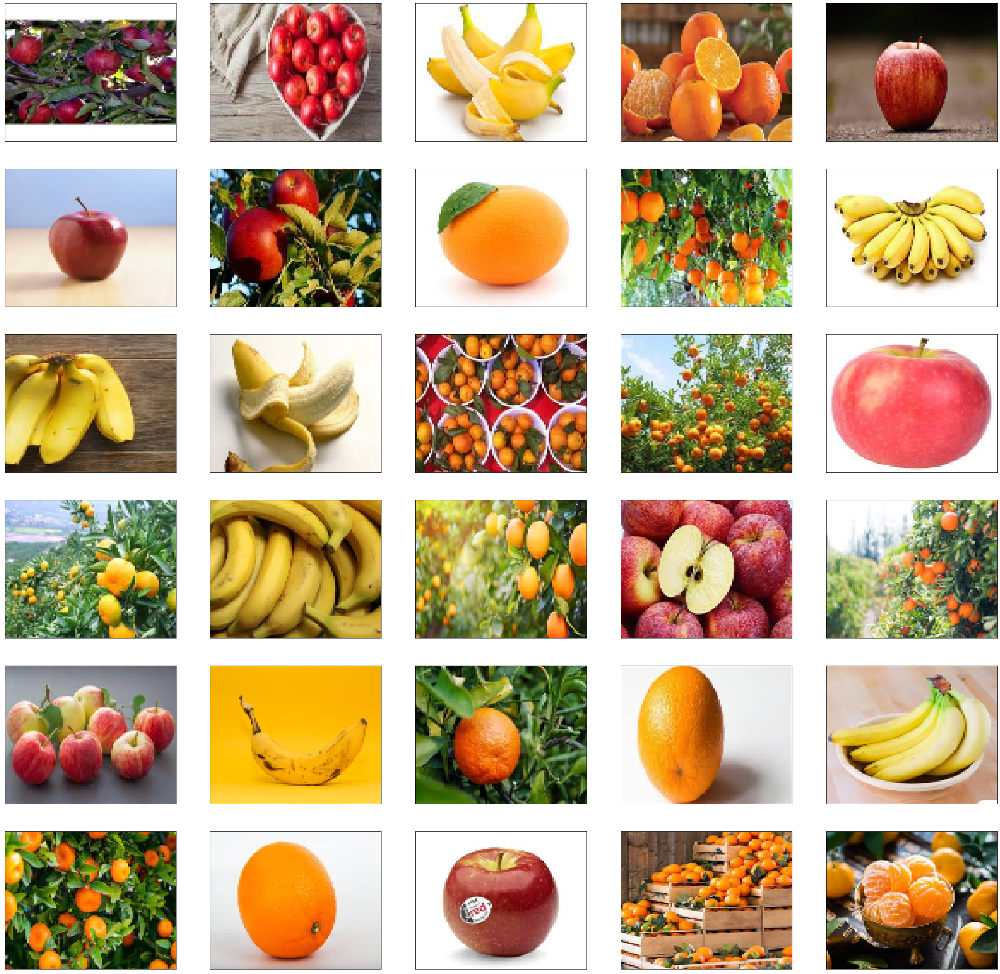

In [10]:
show_rand(random.sample(os.listdir('fresh'), 30))

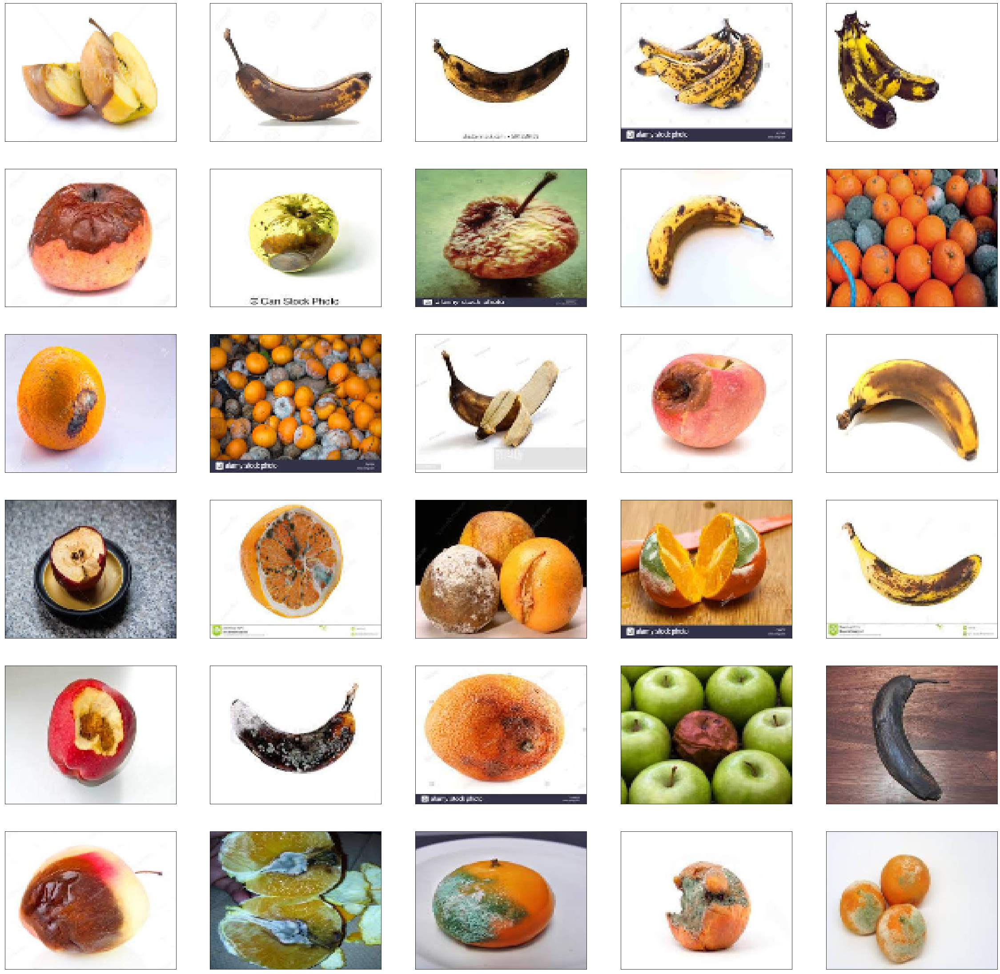

In [12]:
show_rand(random.sample(os.listdir('Rotten'), 30),dir_='Rotten')

In [111]:
train_datagen = ImageDataGenerator(rescale=1.255,
    width_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.26)

In [112]:
train_generator = train_datagen.flow_from_directory(
    'D:\projects\Fruit_flask\quality',
    target_size=(100,100),
    batch_size=20,
    class_mode='binary',
    subset='training',
    shuffle=True,
    classes={'Rotten':1,
             'fresh':0}) # set as training data


validation_generator = train_datagen.flow_from_directory(
    'D:\projects\Fruit_flask\quality', # same directory as training data
    target_size=(100,100),
    batch_size=20,
    class_mode='binary',
    subset='validation',
    shuffle=True,
    classes={'Rotten':1,
             'fresh':0})

Found 299 images belonging to 2 classes.
Found 104 images belonging to 2 classes.


In [113]:
train_generator.class_indices, validation_generator.class_indices

({'Rotten': 0, 'fresh': 1}, {'Rotten': 0, 'fresh': 1})

In [114]:
train_generator.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [5]:
rotten_model=load_model('C:/Users/Akhilesh/Downloads/rotten.h5')

In [116]:
rotten_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 100, 100, 32)      896       
_________________________________________________________________
batch_normalization_4 (Batch (None, 100, 100, 32)      128       
_________________________________________________________________
separable_conv2d_3 (Separabl (None, 100, 100, 32)      1344      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 50, 50, 32)        128       
_________________________________________________________________
dropout_4 (Dropout)          (None, 50, 50, 32)        0         
_________________________________________________________________
separable_conv2d_4 (Separabl (None, 50, 50, 64)       

In [117]:
for layer in rotten_model.layers[:5]:
    layer.trainable = False

In [118]:
lr_rate=tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=6, verbose=1, mode='max',
    min_lr=0.00002, cooldown=2)
check_point_2=ModelCheckpoint(
    filepath='C:/Users/Akhilesh/Downloads/local_rotten_lr2.h5', monitor='val_loss', verbose=1, save_best_only=True,
    save_weights_only=False, mode='min')

In [119]:
rotten_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0006), loss='binary_crossentropy',
               metrics=['accuracy'])

In [120]:
history=rotten_model.fit_generator(
    train_generator,
    steps_per_epoch = train_generator.samples // 20,
    validation_data = validation_generator, 
    validation_steps = validation_generator.samples // 20,
    epochs = 100, callbacks=[check_point_2])

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 14 steps, validate for 5 steps
Epoch 1/100
13/14 [==========================>...] - ETA: 0s - loss: 15.1625 - accuracy: 0.2780
Epoch 00001: val_loss improved from inf to 8.93708, saving model to C:/Users/Akhilesh/Downloads/local_rotten_lr2.h5
14/14 [==============================] - 3s 239ms/step - loss: 14.7135 - accuracy: 0.2760 - val_loss: 8.9371 - val_accuracy: 0.4200
Epoch 2/100
13/14 [==========================>...] - ETA: 0s - loss: 5.4845 - accuracy: 0.3166
Epoch 00002: val_loss improved from 8.93708 to 2.35004, saving model to C:/Users/Akhilesh/Downloads/local_rotten_lr2.h5
14/14 [==============================] - 2s 123ms/step - loss: 5.4200 - accuracy: 0.3226 - val_loss: 2.3500 - val_accuracy: 0.5200
Epoch 3/100
13/14 [==========================>...] - ETA: 0s - loss: 2.5986 - accuracy: 0.3398
Epoch 00003: val_loss improved from 2.35004 to 0.85463, saving model to C:/Users/Akhilesh/Downloads/local_rotten_lr2.h5
14/1

Epoch 27/100
13/14 [==========================>...] - ETA: 0s - loss: 0.3308 - accuracy: 0.8649 ETA: 0s - loss: 0.2867 - 
Epoch 00027: val_loss improved from 0.23847 to 0.17761, saving model to C:/Users/Akhilesh/Downloads/local_rotten_lr2.h5
14/14 [==============================] - 2s 134ms/step - loss: 0.3230 - accuracy: 0.8710 - val_loss: 0.1776 - val_accuracy: 0.9400
Epoch 28/100
13/14 [==========================>...] - ETA: 0s - loss: 0.2525 - accuracy: 0.8919
Epoch 00028: val_loss did not improve from 0.17761
14/14 [==============================] - 2s 123ms/step - loss: 0.2692 - accuracy: 0.8889 - val_loss: 0.2818 - val_accuracy: 0.9300
Epoch 29/100
13/14 [==========================>...] - ETA: 0s - loss: 0.2476 - accuracy: 0.9073
Epoch 00029: val_loss did not improve from 0.17761
14/14 [==============================] - 2s 124ms/step - loss: 0.2503 - accuracy: 0.9068 - val_loss: 0.2442 - val_accuracy: 0.9300
Epoch 30/100
13/14 [==========================>...] - ETA: 0s - loss: 0

Epoch 86/100
13/14 [==========================>...] - ETA: 0s - loss: 0.1057 - accuracy: 0.9575
Epoch 00086: val_loss did not improve from 0.17761
14/14 [==============================] - 2s 125ms/step - loss: 0.1010 - accuracy: 0.9606 - val_loss: 0.6000 - val_accuracy: 0.9100
Epoch 87/100
13/14 [==========================>...] - ETA: 0s - loss: 0.1264 - accuracy: 0.9577
Epoch 00087: val_loss did not improve from 0.17761
14/14 [==============================] - 2s 127ms/step - loss: 0.1278 - accuracy: 0.9536 - val_loss: 0.3838 - val_accuracy: 0.8900
Epoch 88/100
13/14 [==========================>...] - ETA: 0s - loss: 0.0914 - accuracy: 0.9768
Epoch 00088: val_loss did not improve from 0.17761
14/14 [==============================] - 2s 125ms/step - loss: 0.0880 - accuracy: 0.9785 - val_loss: 0.4186 - val_accuracy: 0.9000
Epoch 89/100
13/14 [==========================>...] - ETA: 0s - loss: 0.0733 - accuracy: 0.9768
Epoch 00089: val_loss did not improve from 0.17761
14/14 [============

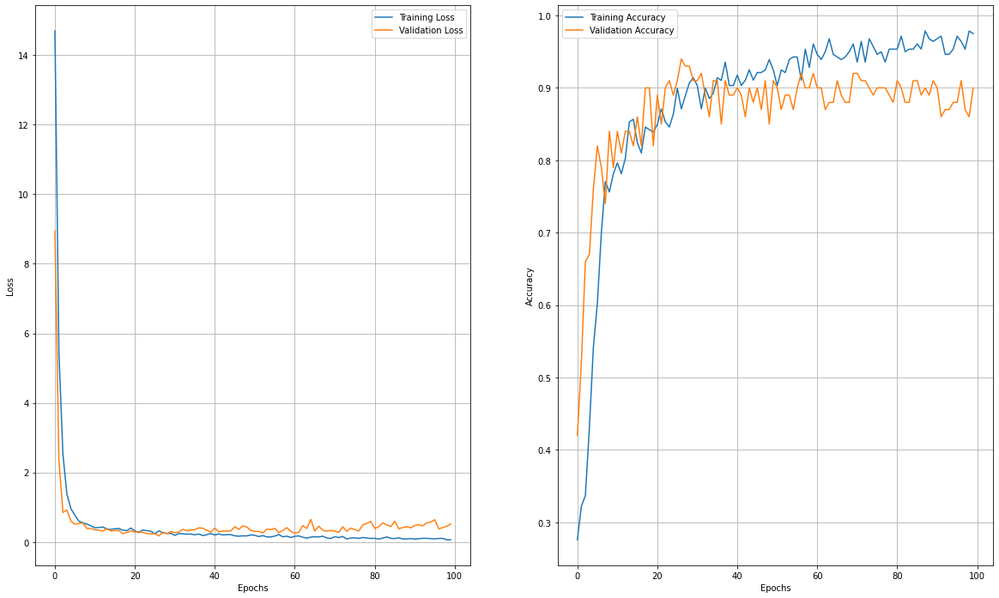

In [122]:
plt.figure(1, figsize = (20, 12))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot( history.history["loss"], label = "Training Loss")
plt.plot( history.history["val_loss"], label = "Validation Loss")
plt.grid(True)
plt.legend()

plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot( history.history["accuracy"], label = "Training Accuracy")
plt.plot( history.history["val_accuracy"], label = "Validation Accuracy")
plt.grid(True)
plt.legend()

In [2]:
#$main
rotten_model=load_model('C:/Users/Akhilesh/Downloads/local_rotten_lr2_final.h5')

NameError: name 'load_model' is not defined

In [125]:
def show_rand_pred(x,dir_='fresh', model=None, model_2=None):
    if len(x)==30:
        f,ax=plt.subplots(6,5,figsize=(40,40))
        for i,file_name in enumerate(x):
            img=cv2.imread( os.path.join(dir_,file_name) )
            img=cv2.resize(img,(100,100))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            ax[i//5][i%5].set_title('Fruit:{}, quality:{}'.format(model.predict_classes(np.expand_dims(img,axis=0)),model_2.predict_classes(np.expand_dims(img,axis=0))))
            ax[i//5][i%5].imshow(img, aspect='auto')
            ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
        plt.show()

## Final
### Apple:0, banana:1, Orange:2
### Rotten:0, Fresh:1

> Check for Rottten ones First

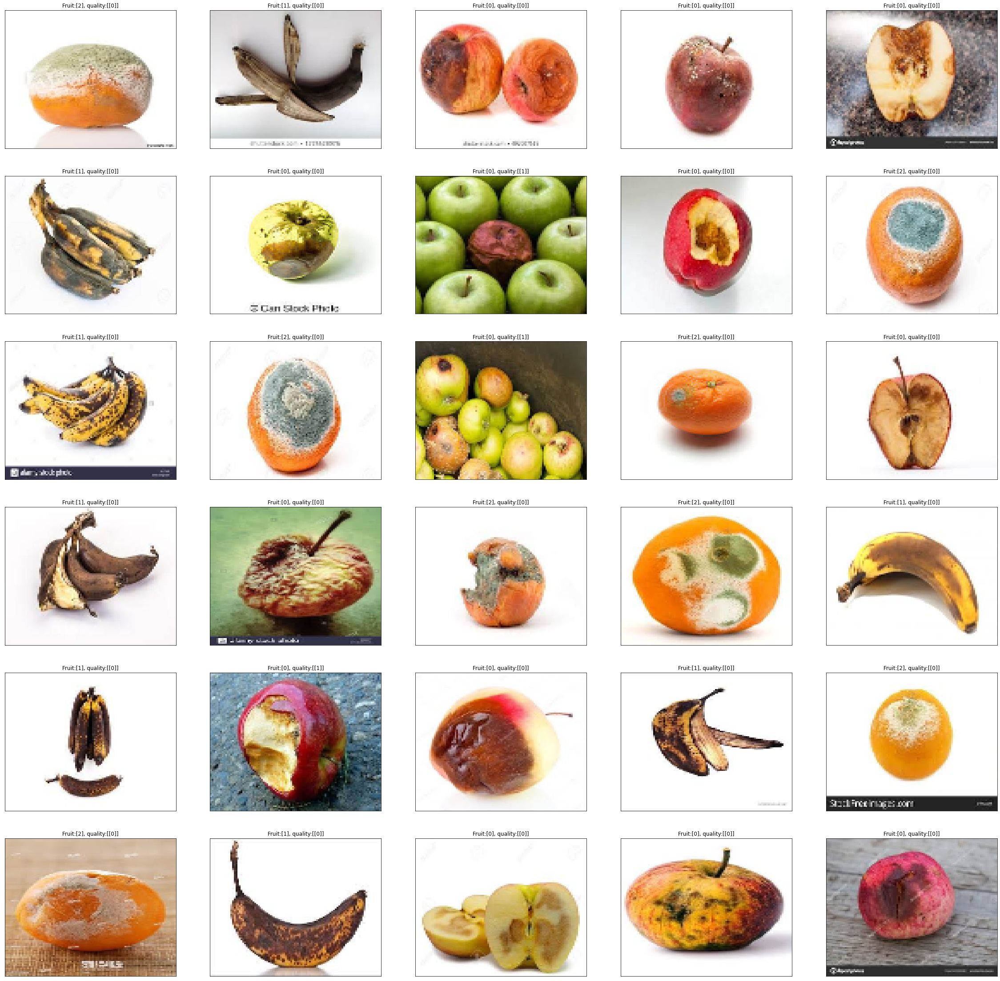

In [131]:
show_rand_pred(random.sample(os.listdir('Rotten'), 30),dir_='Rotten',model=new_model, model_2=rotten_model)

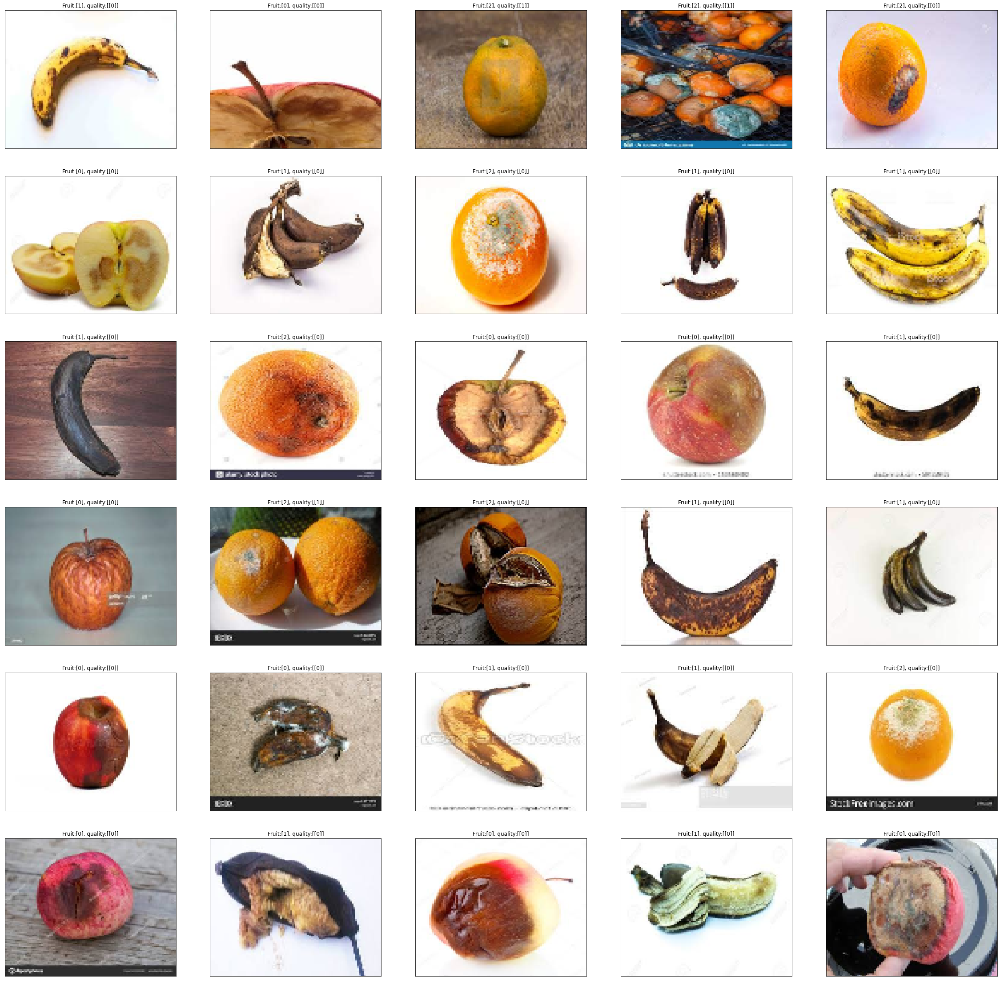

In [133]:
show_rand_pred(random.sample(os.listdir('Rotten'), 30),dir_='Rotten',model=new_model, model_2=rotten_model)

> Let's see our model predtions on Fresh fruits

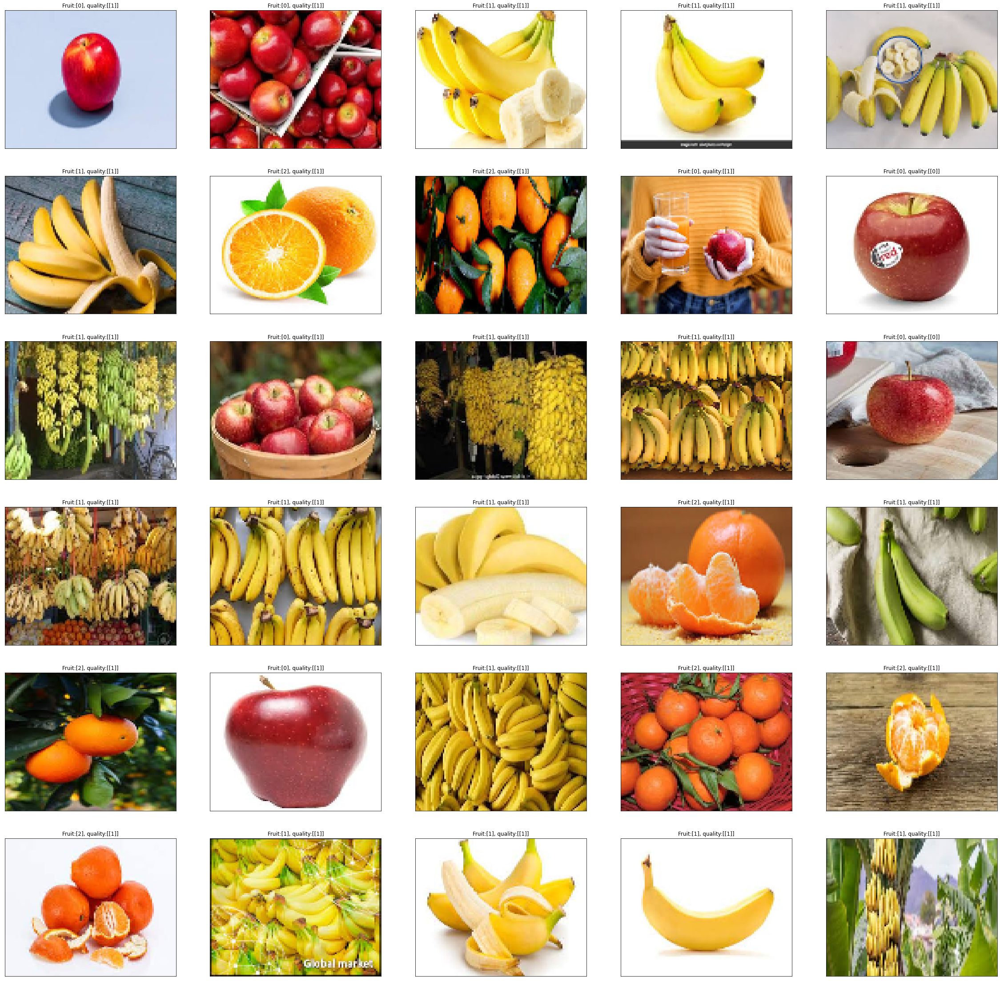

In [132]:
show_rand_pred(random.sample(os.listdir('fresh'), 30),dir_='fresh',model=new_model, model_2=rotten_model)

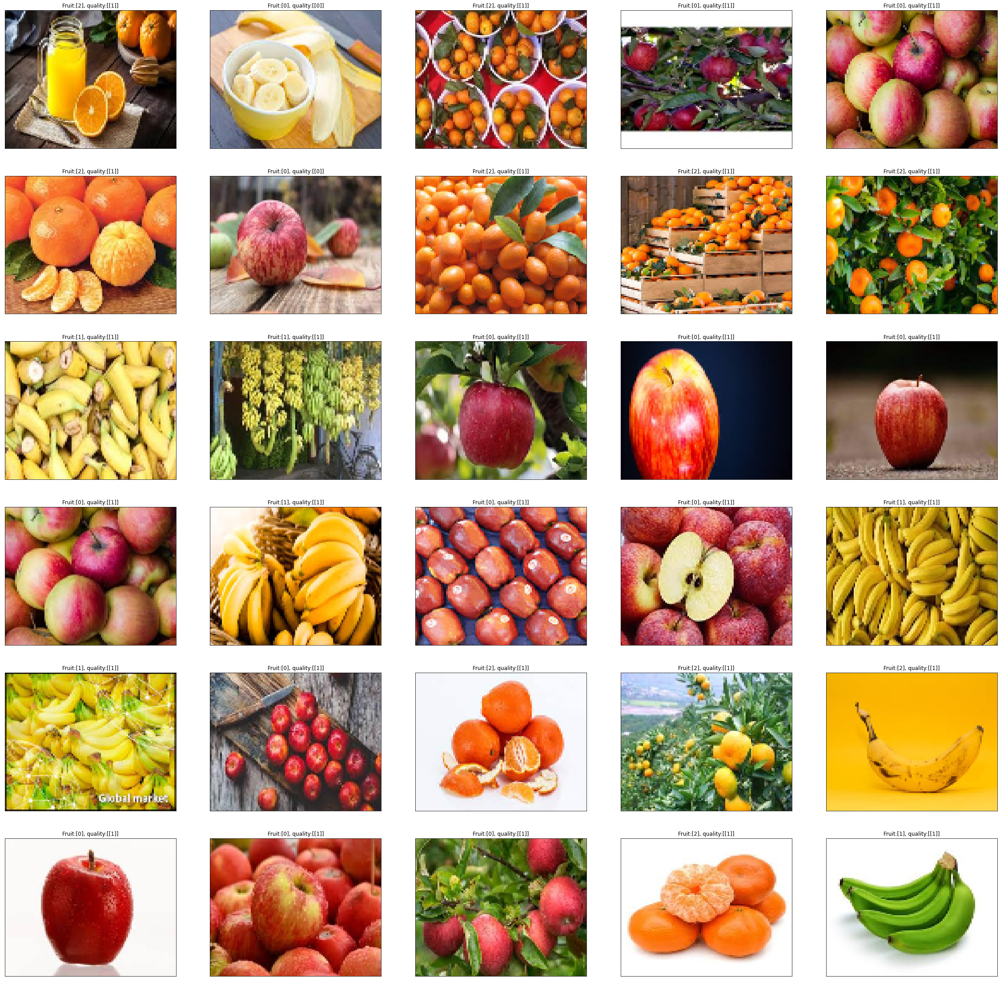

In [135]:
show_rand_pred(random.sample(os.listdir('fresh'), 30),dir_='fresh',model=new_model, model_2=rotten_model)

# Best Combo in Fruit detection + Quality Dection

## Now lets check randomly by downloading our images from Internet

In [10]:
def upload_check(name,model_1=None, model_2=None):
    path=os.path.join(r'C:\Users\Akhilesh\Downloads',name)
    img=cv2.imread(path)
    img=cv2.resize(img,(100,100))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(6,6))
    plt.title('Fruit:{}, quality:{}'.format(model_1.predict_classes(np.expand_dims(img,axis=0)),model_2.predict_classes(np.expand_dims(img,axis=0))))
    plt.imshow(img)

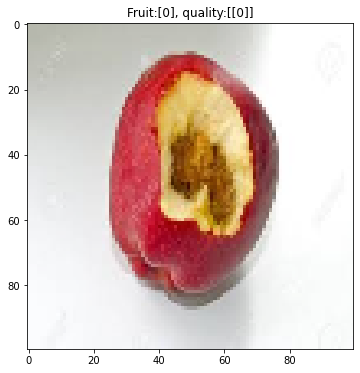

In [13]:
upload_check('f8.jpg', new_model, rotten_model)

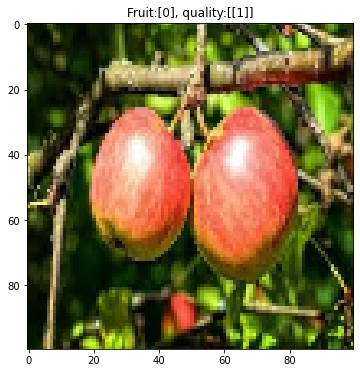

In [12]:
upload_check('f11.jpg', new_model, rotten_model)

In [25]:
path=os.path.join(r'C:\Users\Akhilesh\Downloads','f11.jpg')
img=cv2.imread(path)
img=cv2.resize(img,(100,100))
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
new_model.predict(np.expand_dims(img,axis=0)),rotten_model.predict(np.expand_dims(img,axis=0))

(array([[9.9751651e-01, 2.4080093e-03, 7.5555297e-05]], dtype=float32),
 array([[0.9999838]], dtype=float32))

In [6]:
def analyse(name, model_1=None, model_2=None):
    path=os.path.join(r'C:\Users\Akhilesh\Downloads',name)
    img=cv2.imread(path)
    img=cv2.resize(img,(100,100))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    f,ax=plt.subplots(1,2, figsize=(15,6))
    
    label_q=['Fresh','Rotten']
    pred= [model_2.predict(np.expand_dims(img,axis=0))[0][0],1-model_2.predict(np.expand_dims(img,axis=0))[0][0]]
    ax[0].set_title('Quality')
    sns.barplot(label_q, pred, ax=ax[0])
    
    ax[1].set_title('Fruit')
    label_fruit=['Apple','Banana', 'Orange']
    pred=model_1.predict(np.expand_dims(img,axis=0))[0]
    sns.barplot(label_fruit, pred, ax=ax[1])
    plt.show()
    

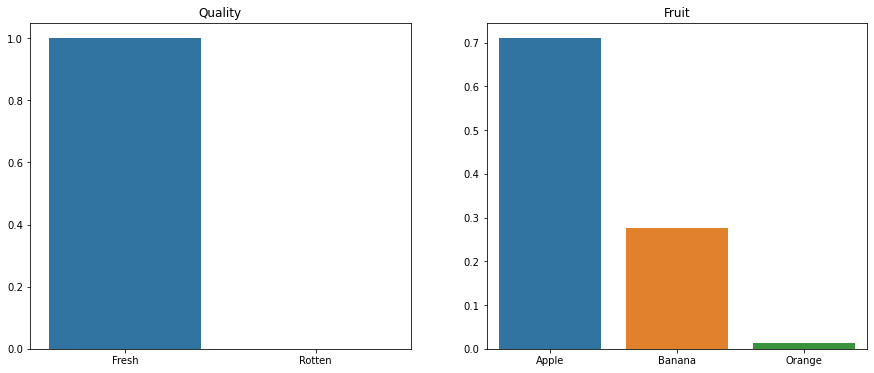

In [9]:
analyse('f1.jpg', new_model, rotten_model)

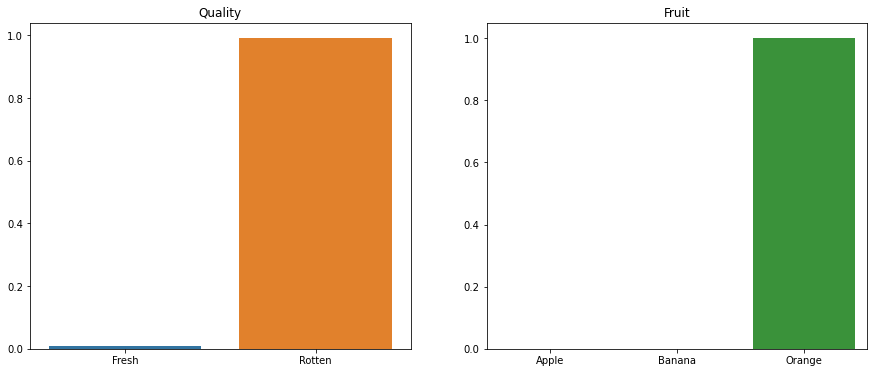

In [10]:
analyse('f6.jpg', new_model, rotten_model)

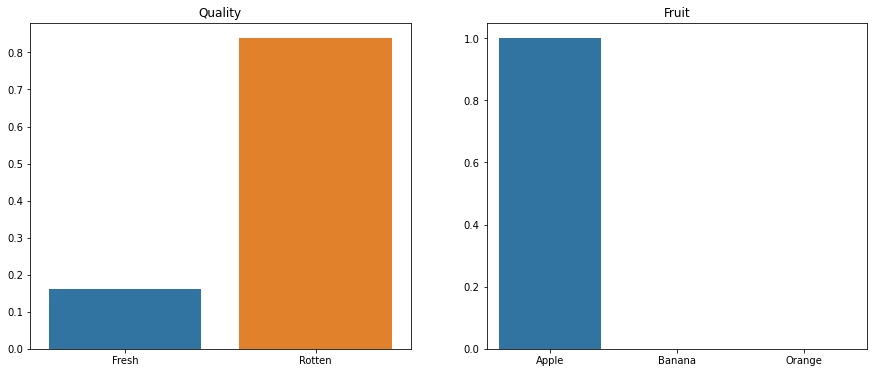

In [98]:
analyse('f8.jpg', new_model, rotten_model)

## SAVE our models Now!!!

In [37]:
import pickle

In [35]:
%cd D:\projects\Fruit_flask

D:\projects\Fruit_flask


In [49]:
with open('model_1.pkl','wb') as f:
    pickle.dump(new_model,f)

TypeError: can't pickle _thread.RLock objects

In [43]:
%cd C:\Users\Akhilesh

C:\Users\Akhilesh
